In [390]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import torch

from segment_anything import sam_model_registry, SamPredictor

In [391]:
def show_mask(mask: np.ndarray, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords: np.ndarray, labels: np.ndarray, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box: np.ndarray, ax, color: str | list[float]="green"):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor=color, facecolor=(0,0,0,0), lw=2))

# Image

In [392]:
image = cv2.imread(r"wallpapers/0562(20200930).jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image.shape

(1080, 1920, 3)

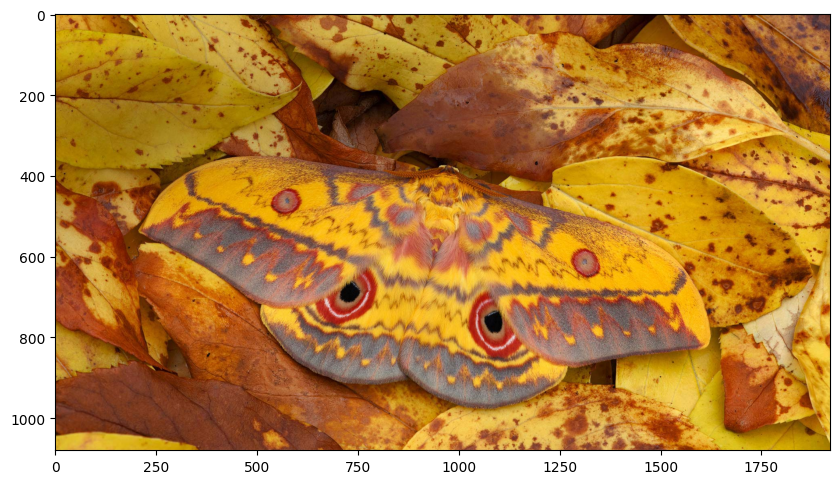

In [393]:
plt.figure(figsize=(10, 9))
plt.imshow(image)

# 模型

In [394]:
sam_checkpoint = "sam_vit_b_01ec64.pth"
model_type = "vit_b"
device = "cuda"

In [395]:
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

Sam(
  (image_encoder): ImageEncoderViT(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (blocks): ModuleList(
      (0-11): 12 x Block(
        (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (proj): Linear(in_features=768, out_features=768, bias=True)
        )
        (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (lin1): Linear(in_features=768, out_features=3072, bias=True)
          (lin2): Linear(in_features=3072, out_features=768, bias=True)
          (act): GELU(approximate='none')
        )
      )
    )
    (neck): Sequential(
      (0): Conv2d(768, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): LayerNorm2d()
      (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (3): LayerNorm2d()
    )


In [396]:
predictor = SamPredictor(sam)

## image encoder

In [397]:
predictor.set_image(image)

# predict parameters

- param
  - point_coords (np.ndarray):    (X,Y)形式的坐标, [[x1, y1], [x2, y2],...]
  - point_labels (np.ndarray):    坐标的类型,前景或背景, 0代表背景, 1代表前景
  - box (np.ndarray):             坐标提示, [x1, y1, x2, y2]
  - mask_input (np.ndarray):      低分辨率的mask, 前一个迭代的输出, Has form 1xHxW, where for SAM, H=W=256.
  - multimask_output (bool):      是否返回多个输出, True返回3个, False返回1个
  - return_logits (bool):         If true, returns un-thresholded masks logits instead of a binary mask.

- returns
  - masks (np.ndarray):  CxHxW, C代表返回mask数量, (H, W)是原图大小
  - scores (np.ndarray): [C] 的array,代表每个mask的得分
  - logits (np.ndarray): An array of shape CxHxW, where C is the number of masks and H=W=256. These low resolution logits can be passed to a subsequent iteration as mask input.

# point 提示

## 单个point

In [398]:
input_point = np.array([[960, 540]])    # x,y
input_label = np.array([1])             # 1代表前景,0代表背景

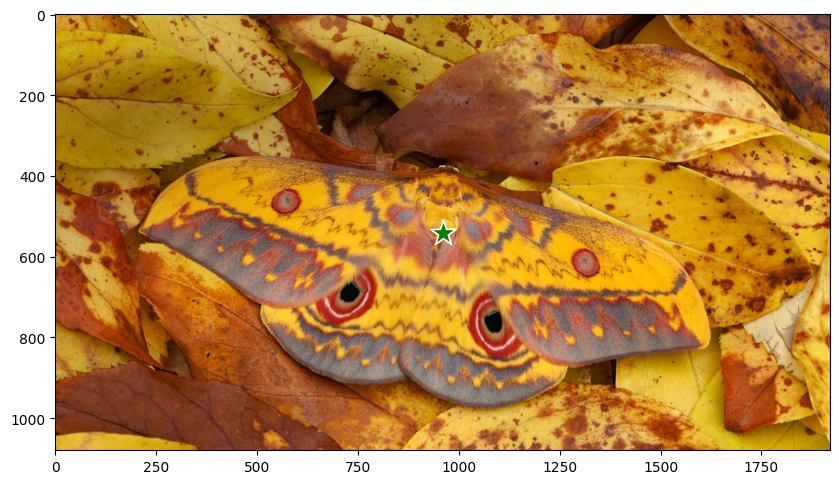

In [399]:
plt.figure(figsize=(10,7))
plt.imshow(image)
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show()

In [400]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,      # 返回3个mask
    )

In [401]:
masks.shape # (number_of_masks) x H x W

(3, 1080, 1920)

In [402]:
scores

array([0.84063804, 0.87183934, 0.47791484], dtype=float32)

In [403]:
logits.shape

(3, 256, 256)

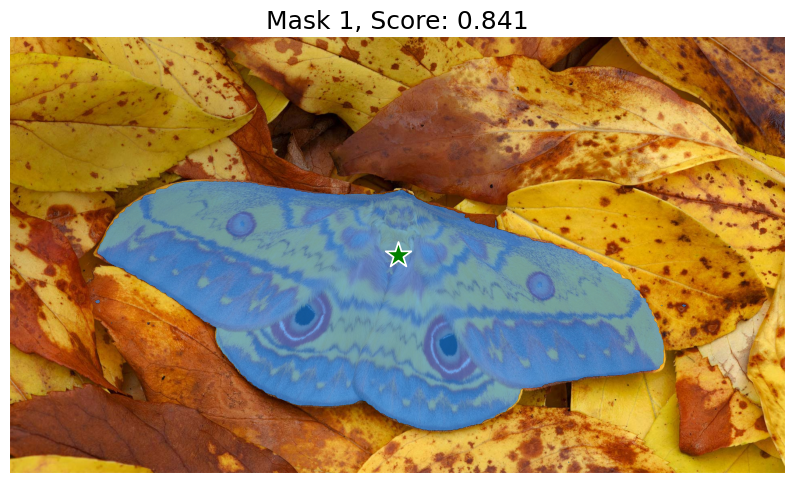

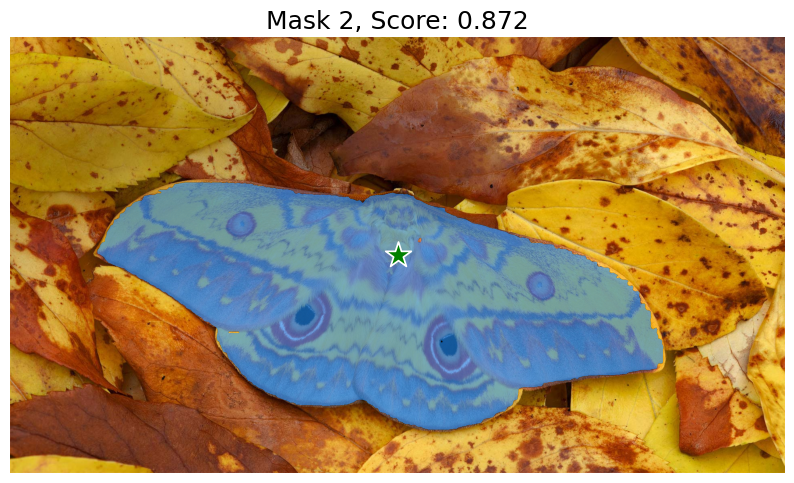

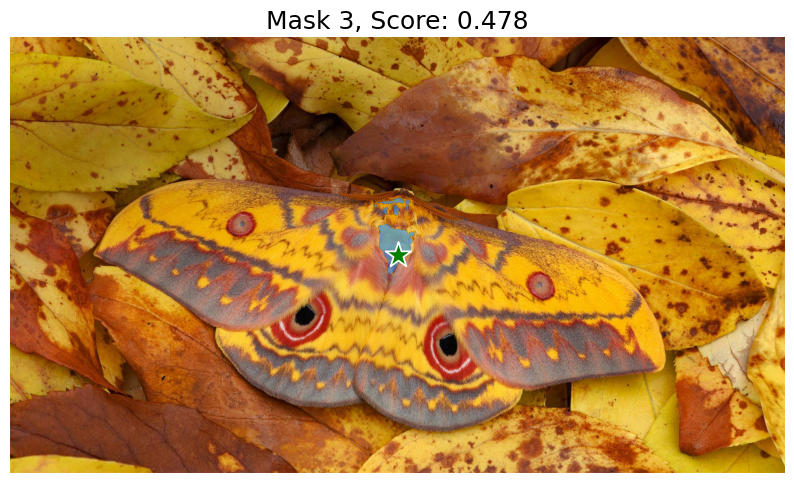

In [404]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,7))
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()

## 返回1个mask

In [405]:
input_point = np.array([[960, 540]])    # x,y
input_label = np.array([1])             # 1代表前景,0代表背景

In [406]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=False,
    )

In [407]:
masks.shape # (number_of_masks) x H x W

(1, 1080, 1920)

In [408]:
scores

array([0.43311384], dtype=float32)

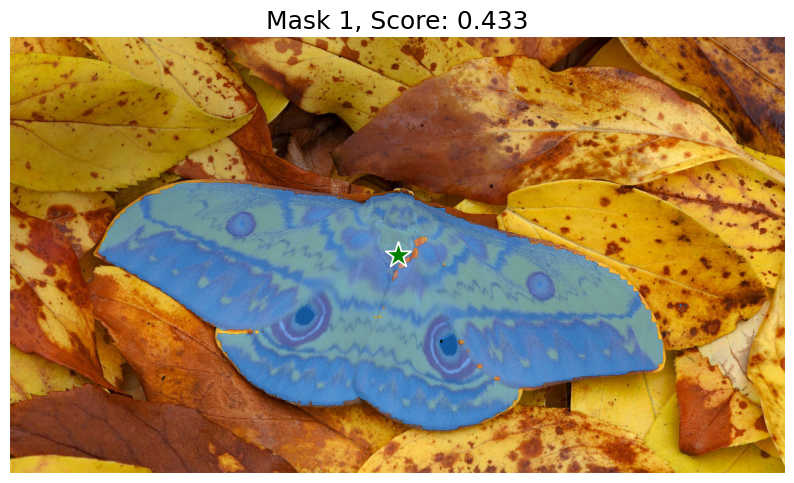

In [409]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,7))
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()

## mask_input

In [411]:
input_point = np.array([[960, 540]])    # x,y
input_label = np.array([1])             # 1代表前景,0代表背景

mask_input = logits[np.argmax(scores), :, :]  # Choose the model's best mask
mask_input.shape

(256, 256)

In [415]:
mask_input[None, :, :].shape

(1, 256, 256)

In [416]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    mask_input=mask_input[None, :, :],
    multimask_output=False,
    )

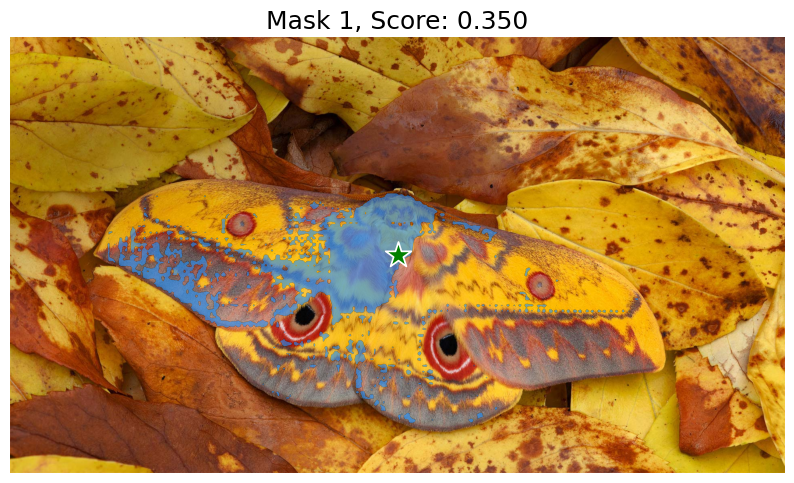

In [417]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,7))
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()

## 多个points

In [345]:
input_point = np.array([[960, 540], [900, 800]])    # x,y
input_label = np.array([1, 1])                      # 1代表前景,0代表背景

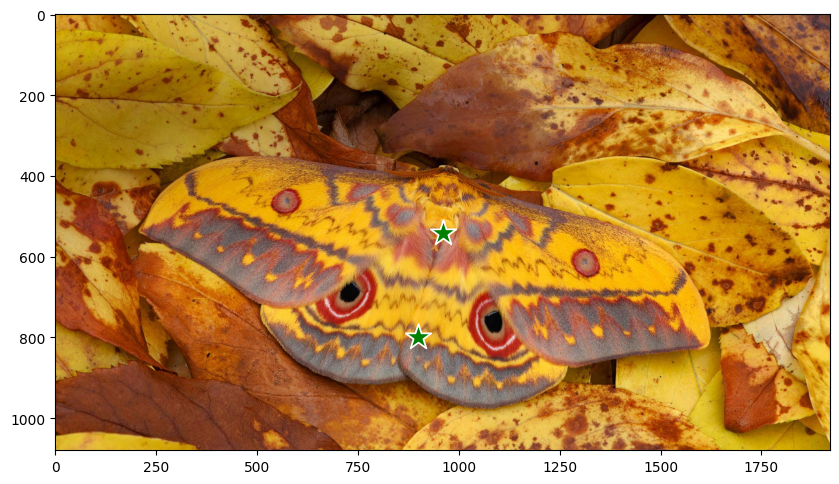

In [346]:
plt.figure(figsize=(10,7))
plt.imshow(image)
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show()

In [347]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
    )

In [348]:
masks.shape # (number_of_masks) x H x W

(3, 1080, 1920)

In [349]:
scores

array([0.89749193, 0.9636807 , 0.51918924], dtype=float32)

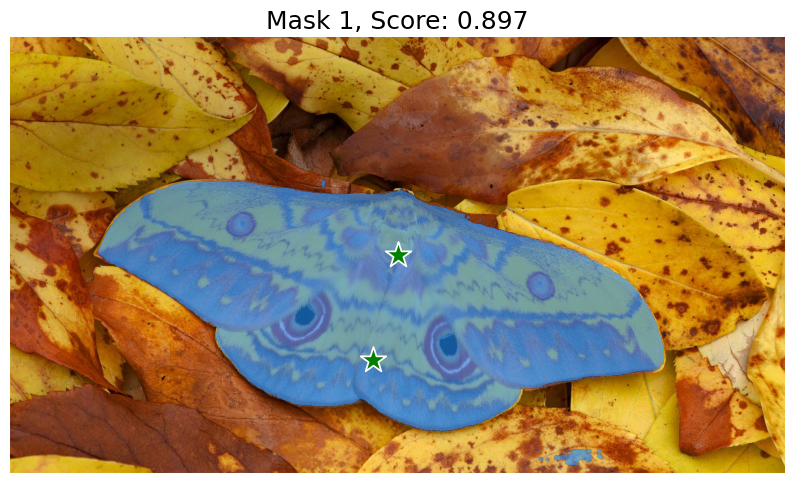

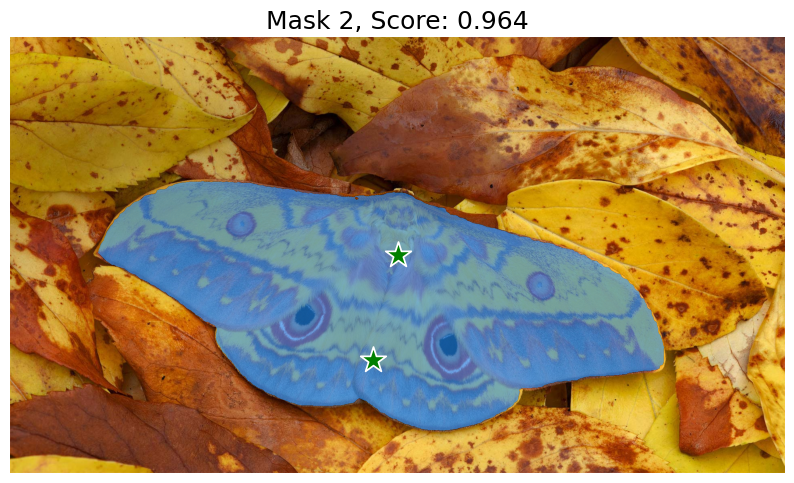

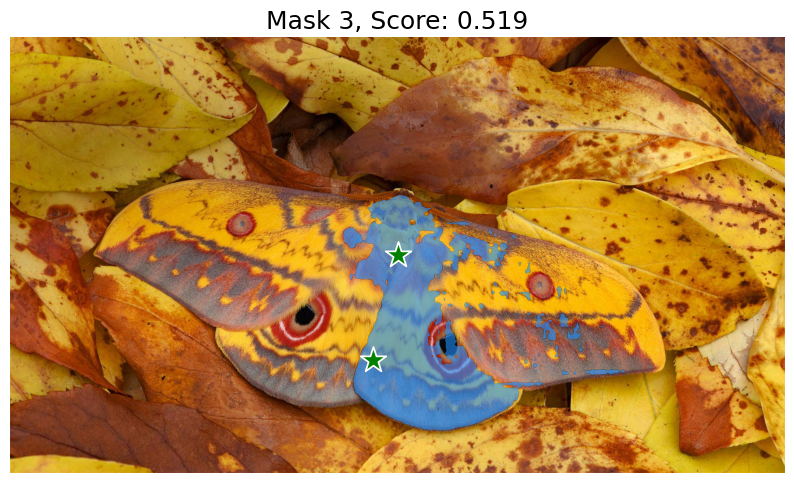

In [350]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,7))
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()

## 多个points(前景和背景)

In [351]:
input_point = np.array([[960, 540], [900, 800], [200, 200], [1500, 450], [500, 900]])    # x,y
input_label = np.array([1, 1, 0, 0, 0])                      # 1代表前景,0代表背景

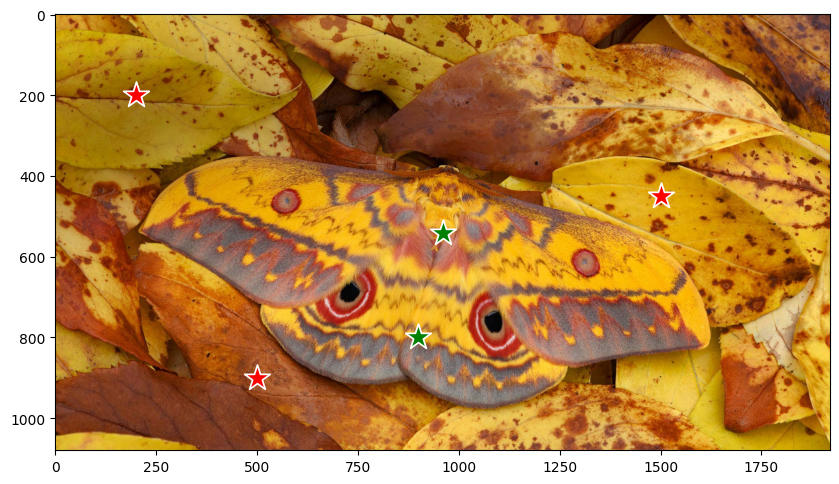

In [352]:
plt.figure(figsize=(10,7))
plt.imshow(image)
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show()

In [353]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=False,
    )

In [354]:
masks.shape # (number_of_masks) x H x W

(1, 1080, 1920)

In [355]:
scores

array([0.9758345], dtype=float32)

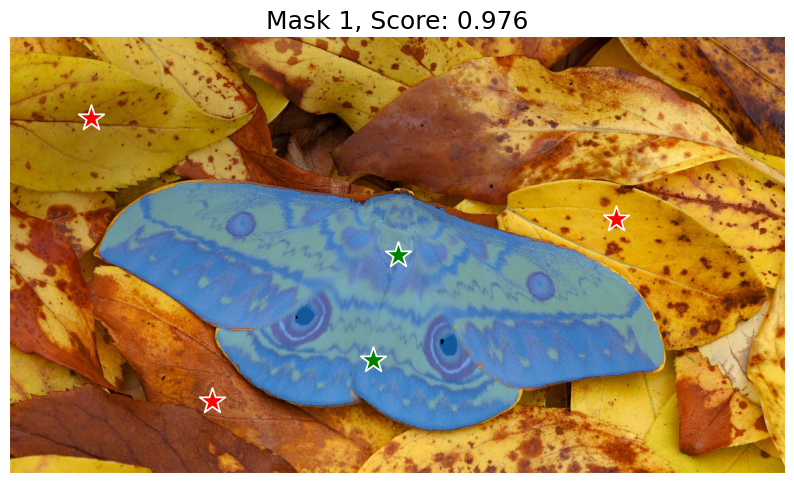

In [356]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,7))
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()

# box提示(每次只能有1个box)

In [357]:
input_box = np.array([190, 330, 1650, 980])

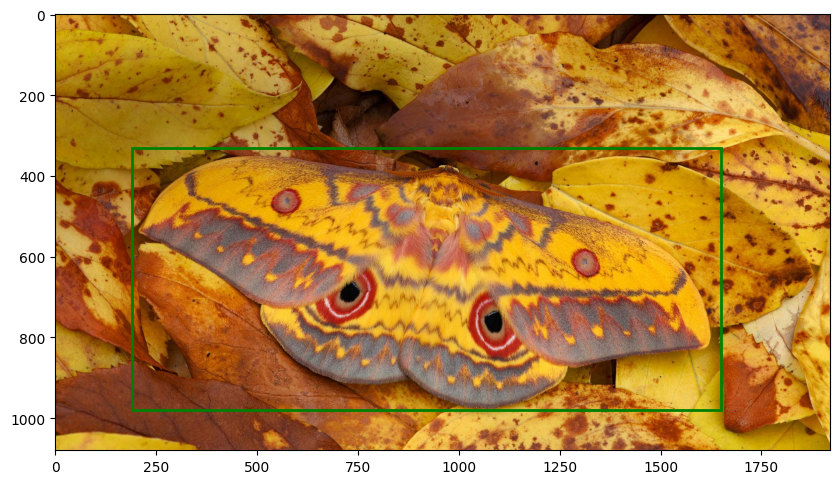

In [358]:
plt.figure(figsize=(10,7))
plt.imshow(image)
show_box(input_box, plt.gca())

In [359]:
masks, scores, logits = predictor.predict(
    box=input_box,
    multimask_output=False,
    )

In [360]:
masks.shape # (number_of_masks) x H x W

(1, 1080, 1920)

In [361]:
scores

array([0.99389267], dtype=float32)

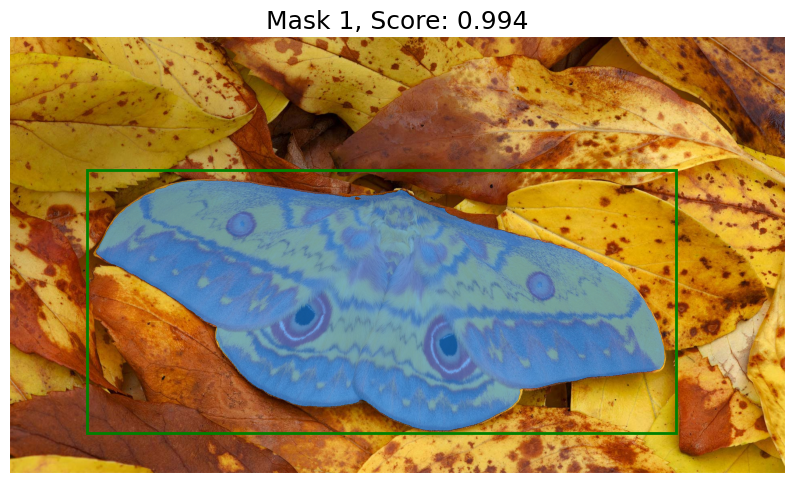

In [362]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,7))
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_box(input_box, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()

# box结合point

In [363]:
input_point = np.array([[960, 650], [500, 900]])    # x,y
input_label = np.array([1, 0])                      # 1代表前景,0代表背景
input_box = np.array([190, 330, 1650, 980])

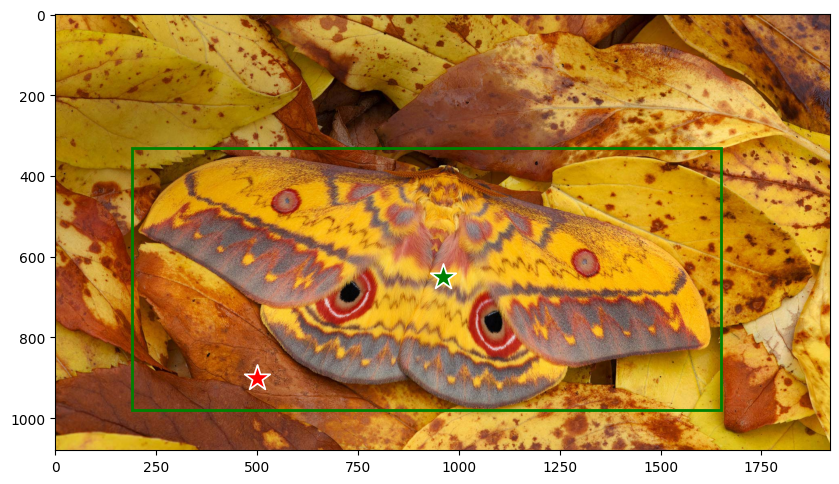

In [364]:
plt.figure(figsize=(10,7))
plt.imshow(image)
show_box(input_box, plt.gca())
show_points(input_point, input_label, plt.gca())

In [365]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    box=input_box,
    multimask_output=False,
    )

In [366]:
masks.shape # (number_of_masks) x H x W

(1, 1080, 1920)

In [367]:
scores

array([0.99266285], dtype=float32)

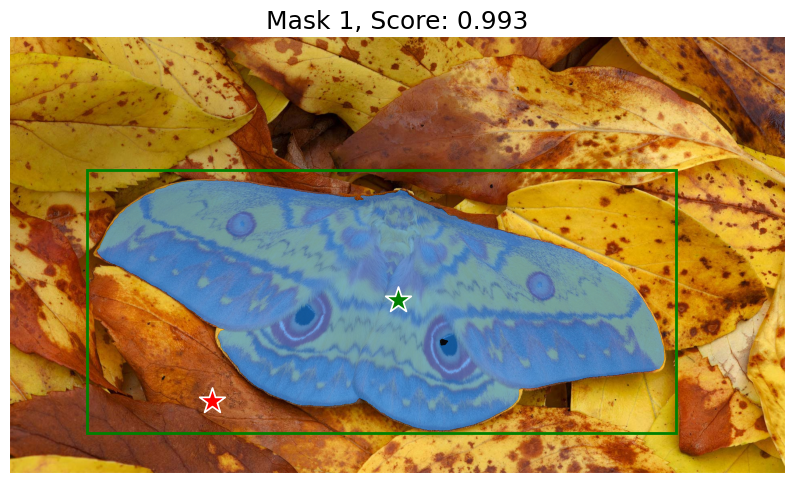

In [368]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,7))
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_box(input_box, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()

# predict parameters

- param
  - point_coords (np.ndarray):    (X,Y)形式的坐标, [[x1, y1], [x2, y2],...]
  - point_labels (np.ndarray):    坐标的类型,前景或背景, 0代表背景, 1代表前景
  - boxes (np.ndarray):           坐标提示, [[x1, y1, x2, y2], [x1, y1, x2, y2],...]
  - mask_input (np.ndarray):      低分辨率的mask, 前一个迭代的输出, Has form 1xHxW, where for SAM, H=W=256.
  - multimask_output (bool):      是否返回多个输出, True返回3个, False返回1个
  - return_logits (bool):         If true, returns un-thresholded masks logits instead of a binary mask.

- returns
  - masks (np.ndarray):  BXCxHxW, B代表boxes数量, C代表返回mask数量, (H, W)是原图大小
  - scores (np.ndarray): BXC,代表每个mask的得分
  - logits (np.ndarray): An array of shape BxCxHxW, where C is the number of masks and H=W=256. These low resolution logits can be passed to a subsequent iteration as mask input.

# batch box torch

In [418]:
input_boxes = np.array([
    [190, 330, 1650, 980],
    [0, 20, 630, 400],
    [760, 20, 1920, 450],
])

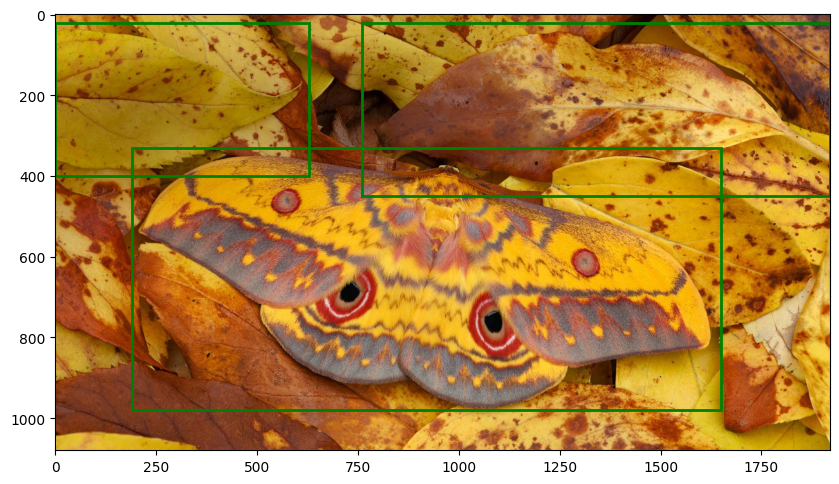

In [419]:
plt.figure(figsize=(10,7))
plt.imshow(image)
for input_box in input_boxes:
    show_box(input_box, plt.gca())

In [420]:
input_boxes_tensor = torch.tensor(input_boxes, device=device)
transformed_boxes = predictor.transform.apply_boxes_torch(input_boxes_tensor, image.shape[:2])

In [425]:
masks, scores, logits = predictor.predict_torch(
    point_coords=None,
    point_labels=None,
    boxes=transformed_boxes,
    multimask_output=False,
)

In [426]:
masks = masks.cpu().numpy()
masks.shape

(3, 1, 1080, 1920)

In [427]:
scores

tensor([[0.9939],
        [0.9545],
        [0.8248]], device='cuda:0')

In [428]:
logits.shape

torch.Size([3, 1, 256, 256])

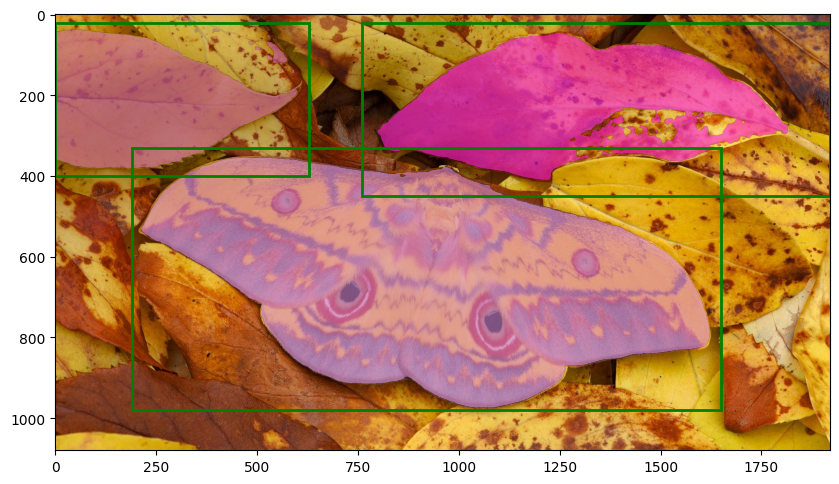

In [388]:
plt.figure(figsize=(10,7))
plt.imshow(image)
for mask in masks:
    show_mask(mask, plt.gca(), random_color=True)
for input_box in input_boxes:
    show_box(input_box, plt.gca())